<a href="https://colab.research.google.com/github/Anik-1802021/ML_Autoencoder_Increase_Performance/blob/main/Increase%20PNSR%20v7.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
!pip install bm3d

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 13.4 MB/s eta 0:00:00


In [3]:
import numpy as np
import pandas as pd
import os
from keras.preprocessing import image
import matplotlib.pyplot as plt
from keras.models import Sequential, Model
from keras.layers import Dense, Conv2D, MaxPooling2D,MaxPool2D ,UpSampling2D, Flatten, Input
from keras.optimizers import SGD, Adam, Adadelta, Adagrad
from keras import backend as K
import tensorflow as tf
from tensorflow.keras.callbacks import EarlyStopping
import cv2
from math import log10,sqrt
from scipy.signal import wiener
import bm3d
from skimage.restoration import estimate_sigma

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [5]:
train_images=sorted(os.listdir('/content/drive/MyDrive/Thesis/Swin Transformer /custom_dataset/train/NORMAL'))

In [6]:
train_image=[]
for im in train_images:
  img=image.load_img('/content/drive/MyDrive/Thesis/Swin Transformer /custom_dataset/train/NORMAL/'+im,target_size=(512,512),color_mode='grayscale')
  img=image.img_to_array(img)
  img=img/255
  train_image.append(img)

train_df=np.array(train_image)

In [7]:
#Subplotting images
def plot_img(dataset):
  f,ax=plt.subplots(1,5)
  f.set_size_inches(40,20)
  for i in range(5,10):
    ax[i-5].imshow(dataset[i].reshape(512,512), cmap='gray')
  plt.show()

In [8]:
# #Adding gaussian noise with 0.05 factor
# def add_noise(image):
#   row,col,ch=image.shape
#   mean=0
#   sigma=1
#   gauss=np.random.normal(mean,sigma,(row,col,ch))
#   gauss=gauss.reshape(row,col,ch)
#   noisy=image+gauss*0.05
#   return noisy

In [9]:
# def add_noise(image):
#     # Create a copy of the image to avoid modifying the original
#     noisy_image = np.copy(image)

#     # Get the dimensions of the image
#     row, col, ch = image.shape

#     # Calculate the number of pixels to be corrupted by noise
#     prob = 0.05  # Adjust the probability of noise
#     num_salt = np.ceil(prob * image.size * 0.5).astype(int)
#     num_pepper = np.ceil(prob * image.size * 0.5).astype(int)

#     # Add salt noise (white pixels)
#     salt_coords = [np.random.randint(0, i, num_salt) for i in image.shape]
#     noisy_image[salt_coords[0], salt_coords[1], :] = 255  # Assuming the image is in the 0-255 range

#     # Add pepper noise (black pixels)
#     pepper_coords = [np.random.randint(0, i, num_pepper) for i in image.shape]
#     noisy_image[pepper_coords[0], pepper_coords[1], :] = 0

#     return noisy_image

In [10]:
# def add_noise(image):

#     # Convert image to float32 to avoid overflow
#     image = image.astype(np.float32) / 255.0

#     # Generate Gaussian noise
#     noise = np.random.randn(*image.shape)

#     # Add speckle noise
#     noise_factor = 0.005  # Adjust the noise factor as needed
#     noisy_image = image + image * noise * noise_factor

#     # Clip values to [0, 1] range
#     noisy_image = np.clip(noisy_image, 0.0, 1.0)

#     # Convert back to uint8
#     noisy_image = (noisy_image * 255).astype(np.uint8)

#     return noisy

In [11]:
def add_noise(image):

    # Generate random noise
    noise_level = 0.5  # Adjust the noise level as needed
    noisy_image = image + noise_level * np.random.normal(loc=0.0, scale=1.0, size=image.shape)
    noisy_image = np.clip(noisy_image, 0., 1.)
    return noisy_image  # Convert back to uint8

In [12]:
noised_df=[]
for img in train_df:
  noisy=add_noise(img)
  noised_df.append(noisy)

noised_df=np.array(noised_df)

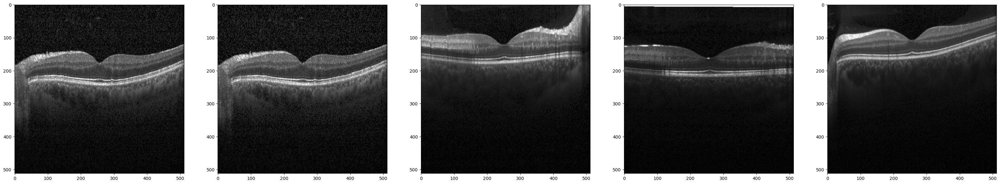

In [13]:
plot_img(train_df)

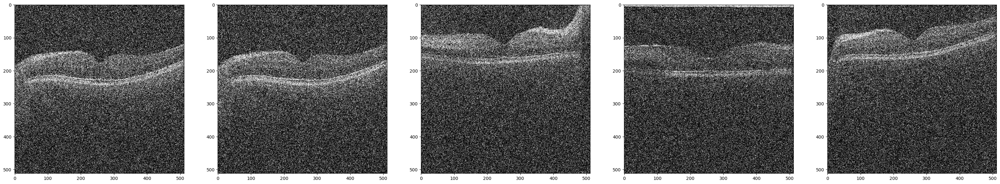

In [14]:
plot_img(noised_df)

In [15]:
original_train=train_df[:400]
original_test=train_df[400:]

noised_train=noised_df[:400]
noised_test=noised_df[400:]

In [16]:
def autoencoder():
  input_img=Input(shape=(512,512,1),name='image_input')
  #enoder
  x = Conv2D(64, (3,3), activation='relu', padding='same', name='Conv1')(input_img)
  x = MaxPooling2D((2,2), padding='same', name='pool1')(x)
  x = Conv2D(64, (3,3), activation='relu', padding='same', name='Conv2')(x)
  x = MaxPooling2D((2,2), padding='same', name='pool2')(x)

  #decoder
  x = Conv2D(64, (3,3), activation='relu', padding='same', name='Conv3')(x)
  x = UpSampling2D((2,2), name='upsample1')(x)
  x = Conv2D(64, (3,3), activation='relu', padding='same', name='Conv4')(x)
  x = UpSampling2D((2,2), name='upsample2')(x)
  x = Conv2D(1, (3,3), activation='sigmoid', padding='same', name='Conv5')(x)

  #model
  autoencoder = Model(inputs=input_img, outputs=x)
  autoencoder.compile(optimizer='adam', loss='binary_crossentropy')

  return autoencoder

In [17]:
model= autoencoder()
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 image_input (InputLayer)    [(None, 512, 512, 1)]     0         
                                                                 
 Conv1 (Conv2D)              (None, 512, 512, 64)      640       
                                                                 
 pool1 (MaxPooling2D)        (None, 256, 256, 64)      0         
                                                                 
 Conv2 (Conv2D)              (None, 256, 256, 64)      36928     
                                                                 
 pool2 (MaxPooling2D)        (None, 128, 128, 64)      0         
                                                                 
 Conv3 (Conv2D)              (None, 128, 128, 64)      36928     
                                                                 
 upsample1 (UpSampling2D)    (None, 256, 256, 64)      0     

In [18]:
with tf.device('/device:GPU:0'):
    early_stopping = EarlyStopping(monitor='val_loss', min_delta=0, patience=10, verbose=1, mode='auto')
    model.fit(noised_train, original_train, epochs=2, batch_size=10, validation_data=(noised_test, original_test), callbacks=[early_stopping])

Epoch 1/2
40/40 [==============================] - 20s 260ms/step - loss: 0.4320 - val_loss: 0.3625
Epoch 2/2
40/40 [==============================] - 9s 215ms/step - loss: 0.3610 - val_loss: 0.3503


In [19]:
noised_test =noised_df[400:]

1/1 [==============================] - 2s 2s/step


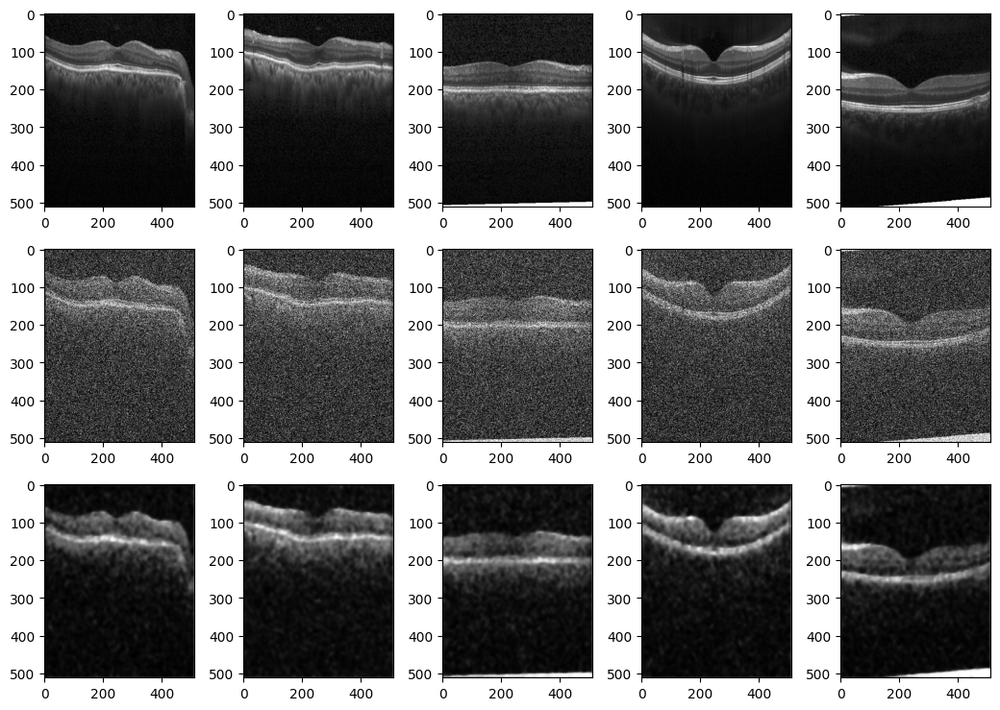

In [20]:
pred= model.predict(noised_test[:5])
def plot_predictions(y_true, y_pred):
    f, ax = plt.subplots(3, 5)
    f.set_size_inches(10.5,7.5)
    for i in range(5):
        ax[0][i].imshow(np.reshape(original_test[i], (512, 512)), aspect='auto', cmap='gray')
        ax[1][i].imshow(np.reshape(y_true[i], (512, 512)), aspect='auto', cmap='gray')
        ax[2][i].imshow(np.reshape(y_pred[i], (512, 512)), aspect='auto', cmap='gray')
    plt.tight_layout()
plot_predictions(noised_test[:5], pred[:5])

In [21]:
noised_test = noised_test.astype(np.float32)
print(original_test[0].dtype)

float32


<ipython-input-22-a7f8192746ce>:1: FutureWarning: `multichannel` is a deprecated argument name for `estimate_sigma`. It will be removed in version 1.0. Please use `channel_axis` instead.
  sigma_est = np.mean(estimate_sigma(noised_test[0], multichannel=False))
/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:348: UserWarning: image is size 1 on the last axis, but channel_axis is None. If this is a color image, please set channel_axis=-1 for proper noise estimation.
  return func(*args, **kwargs)


Text(0.5, 1.0, 'Wiener Filter')

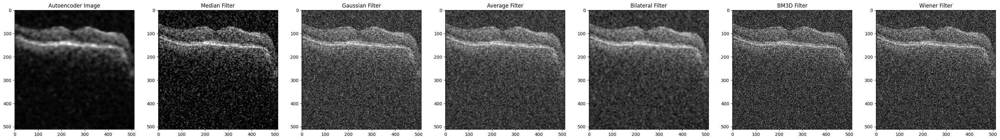

In [22]:
sigma_est = np.mean(estimate_sigma(noised_test[0], multichannel=False))
bm3d_blur = bm3d.bm3d(noised_test[0], sigma_psd=sigma_est)
wiener_blur = wiener(noised_test[0].reshape(512, 512), (3, 3))
median_blur = cv2.medianBlur(noised_test[0], (5))
gaussian_blur=cv2.GaussianBlur(noised_test[0],(5,5),0)
average_blur=cv2.blur(noised_test[0],(5,5))
bilateral_filter=cv2.bilateralFilter(noised_test[0],9,75,75)
f,ax=plt.subplots(1,7)
f.set_size_inches(40,20)
ax[0].imshow(pred[0].reshape(512, 512), cmap='gray')
ax[0].set_title('Autoencoder Image')
ax[1].imshow(median_blur,cmap='gray')
ax[1].set_title('Median Filter')
ax[2].imshow(gaussian_blur,cmap='gray')
ax[2].set_title('Gaussian Filter')
ax[3].imshow(average_blur,cmap='gray')
ax[3].set_title('Average Filter')
ax[4].imshow(bilateral_filter,cmap='gray')
ax[4].set_title('Bilateral Filter')
ax[5].imshow(bm3d_blur,cmap='gray')
ax[5].set_title('BM3D Filter')
ax[6].imshow(wiener_blur,cmap='gray')
ax[6].set_title('Wiener Filter')

In [23]:
def PSNR(original, denoised):
    mse = np.mean((original - denoised) ** 2)
    if(mse == 0):
        return 100
    max_pixel = 255.0
    psnr = 20 * np.log10(max_pixel/sqrt(mse))
    return psnr

value1 = PSNR(original_test[0], median_blur)
value2 = PSNR(original_test[0], pred[0])
value3 = PSNR(original_test[0], gaussian_blur)
value4 = PSNR(original_test[0], average_blur)
value5 = PSNR(original_test[0], bilateral_filter)
value6 = PSNR(original_test[0], bm3d_blur)
value7 = PSNR(original_test[0], wiener_blur)

print("PSNR values")
print(f"Autoencoder Image : {value2} dB")
print(f"Median Filter Image : {value1} dB")
print(f"Gaussian Filter Image : {value3} dB")
print(f"Average Filter Image : {value4} dB")
print(f"Bilateral Filter Image : {value5} dB")
print(f"BM3D Filter Image : {value6} dB")
print(f"Wiener Filter Image : {value7} dB")

PSNR values
Autoencoder Image : 72.95674362486265 dB
Median Filter Image : 61.204156786019716 dB
Gaussian Filter Image : 60.626223492404414 dB
Average Filter Image : 60.89135248403552 dB
Bilateral Filter Image : 61.057323106888255 dB
BM3D Filter Image : 56.59227222273957 dB
Wiener Filter Image : 59.9316074432216 dB


In [24]:
def MSE (original, denoised):
    mse = np.mean((original - denoised) ** 2)
    return mse

value1 = MSE(original_test[0], median_blur)
value2 = MSE(original_test[0], pred[0])
value3 = MSE(original_test[0], gaussian_blur)
value4 = MSE(original_test[0], average_blur)
value5 = MSE(original_test[0], bilateral_filter)
value6 = MSE(original_test[0], bm3d_blur)
value7 = MSE(original_test[0], wiener_blur)

print("MSE values")
print(f"Autoencoder Image : {value2} ")
print(f"Median Filter Image : {value1} ")
print(f"Gaussian Filter Image : {value3} ")
print(f"Average Filter Image : {value4} ")
print(f"Bilateral Filter Image : {value5} ")
print(f"BM3D Filter Image : {value6} ")
print(f"Wiener Filter Image : {value7} ")

MSE values
Autoencoder Image : 0.003291592001914978 
Median Filter Image : 0.04927931725978851 
Gaussian Filter Image : 0.05629346892237663 
Average Filter Image : 0.05295965075492859 
Bilateral Filter Image : 0.05097392201423645 
BM3D Filter Image : 0.14251255903795843 
Wiener Filter Image : 0.06605711717431759 


In [25]:
def SNR(original, denoised):
    signal = original
    noise = original - denoised

    # Calculate the sum of squares
    signal_power = np.sum(signal ** 2)
    noise_power = np.sum(noise ** 2)

    # Calculate SNR in dB
    snr = 10 * np.log10(signal_power / noise_power)
    return snr

value1 = SNR(original_test[0], median_blur)
value2 = SNR(original_test[0], pred[0])
value3 = SNR(original_test[0], gaussian_blur)
value4 = SNR(original_test[0], average_blur)
value5 = SNR(original_test[0], bilateral_filter)
value6 = SNR(original_test[0], bm3d_blur)
value7 = SNR(original_test[0], wiener_blur)

print("SNR values")
print(f"Autoencoder Image : {value2} dB")
print(f"Median Filter Image : {value1} dB")
print(f"Gaussian Filter Image : {value3} dB")
print(f"Average Filter Image : {value4} dB")
print(f"Bilateral Filter Image : {value5} dB")
print(f"BM3D Filter Image : {value6} dB")
print(f"Wiener Filter Image : {value7} dB")


SNR values
Autoencoder Image : 10.541584491729736 dB
Median Filter Image : -28.303701877593994 dB
Gaussian Filter Image : -28.881638050079346 dB
Average Filter Image : -28.616507053375244 dB
Bilateral Filter Image : -28.450536727905273 dB
BM3D Filter Image : -32.915586211514174 dB
Wiener Filter Image : -29.576250991032143 dB


In [26]:
def CNR(img1, img2):
    mean1, std1 = cv2.meanStdDev(img1)
    mean2, std2 = cv2.meanStdDev(img2)
    cnr_value = abs(mean1 - mean2) / (std1 + std2)
    return cnr_value[0][0]

value1 = CNR(original_test[0], median_blur)
value2 = CNR(original_test[0], pred[0])
value3 = CNR(original_test[0], gaussian_blur)
value4 = CNR(original_test[0], average_blur)
value5 = CNR(original_test[0], bilateral_filter)
value6 = CNR(original_test[0], bm3d_blur)
value7 = CNR(original_test[0], wiener_blur)

print("CNR values")
print(f"Autoencoder Image : {value2} ")
print(f"Median Filter Image : {value1} ")
print(f"Gaussian Filter Image : {value3} ")
print(f"Average Filter Image : {value4} ")
print(f"Bilateral Filter Image : {value5} ")
print(f"BM3D Filter Image : {value6} ")
print(f"Wiener Filter Image : {value7} ")

CNR values
Autoencoder Image : 0.029511347860189146 
Median Filter Image : 0.07082662185170086 
Gaussian Filter Image : 0.5206450154712383 
Average Filter Image : 0.5505466668888417 
Bilateral Filter Image : 0.5725262000586406 
BM3D Filter Image : 0.30107453822168484 
Wiener Filter Image : 0.45822326216854986 


In [27]:
from skimage.metrics import structural_similarity as ssim
def SSIM(img1, img2):
    img1 = img1.squeeze()  # Remove channel dimension for SSIM calculation
    img2 = img2.squeeze()
    ssim_value, _ = ssim(img1, img2, full=True)
    return ssim_value

value1 = SSIM(original_test[0], median_blur)
value2 = SSIM(original_test[0], pred[0])
value3 = SSIM(original_test[0], gaussian_blur)
value4 = SSIM(original_test[0], average_blur)
value5 = SSIM(original_test[0], bilateral_filter)
value6 = SSIM(original_test[0], bm3d_blur)
value7 = SSIM(original_test[0], wiener_blur)

print("SSIM values")
print(f"Autoencoder Image : {value2} ")
print(f"Median Filter Image : {value1} ")
print(f"Gaussian Filter Image : {value3} ")
print(f"Average Filter Image : {value4} ")
print(f"Bilateral Filter Image : {value5} ")
print(f"BM3D Filter Image : {value6} ")
print(f"Wiener Filter Image : {value7} ")

SSIM values
Autoencoder Image : 0.6935045423974008 
Median Filter Image : 0.3281987950356343 
Gaussian Filter Image : 0.23818947679912733 
Average Filter Image : 0.30579482844871997 
Bilateral Filter Image : 0.36967258467633723 
BM3D Filter Image : 0.03447375027846858 
Wiener Filter Image : 0.1386855497225431 


/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:348: UserWarning: Inputs have mismatched dtype.  Setting data_range based on im1.dtype.
  return func(*args, **kwargs)


In [30]:
def PSNR(original, denoised):
    mse = np.mean((original - denoised) ** 2)
    if(mse == 0):
        return 100
    max_pixel = 255.0
    psnr = 20 * np.log10(max_pixel/sqrt(mse))
    return psnr

def MSE(original, denoised):
    return np.mean((original - denoised) ** 2)

def SSIM(original, denoised):
    original = original.squeeze()  # Remove channel dimension for SSIM calculation
    denoised = denoised.squeeze()
    ssim_value, _ = ssim(original, denoised, full=True)
    return ssim_value

def SNR(original, denoised):
    signal = original
    noise = original - denoised
    # Calculate the sum of squares
    signal_power = np.sum(signal ** 2)
    noise_power = np.sum(noise ** 2)
    # Calculate SNR in dB
    snr = 10 * np.log10(signal_power / noise_power)
    return snr

def CNR(original, denoised):
    mean1, std1 = cv2.meanStdDev(original)
    mean2, std2 = cv2.meanStdDev(denoised)
    cnr_value = abs(mean1 - mean2) / (std1 + std2)
    return cnr_value[0][0]

metrics_results = []

for i in range(5):
    original_image = original_test[i]
    noised_image = noised_test[i]
        # Apply various filters
    median_blur = cv2.medianBlur(noised_image, 5)
    gaussian_blur = cv2.GaussianBlur(noised_image, (5, 5), 0)
    average_blur = cv2.blur(noised_image, (5, 5))
    bilateral_filter = cv2.bilateralFilter(noised_image, 9, 75, 75)
    sigma_est = np.mean(estimate_sigma(noised_image, multichannel=False))
    bm3d_blur = bm3d.bm3d(noised_image, sigma_psd=sigma_est)
    wiener_blur = wiener(noised_image.reshape(512, 512), (3, 3))
    # Compute Metrics
    metrics_results.append({
        'Original': f'Image {i + 1}',
        'Autoencoder': {
            'MSE': MSE(original_image, pred[i]),
            'PSNR': PSNR(original_image, pred[i]),
            'SSIM': SSIM(original_image, pred[i]),
            'SNR': SNR(original_image, pred[i]),
            'CNR': CNR(original_image, pred[i])
        },
        'Median Filter': {
            'MSE': MSE(original_image, median_blur),
            'PSNR': PSNR(original_image, median_blur),
            'SSIM': SSIM(original_image, median_blur),
            'SNR': SNR(original_image, median_blur),
            'CNR': CNR(original_image, median_blur)
        },
        'Gaussian Filter': {
            'MSE': MSE(original_image, gaussian_blur),
            'PSNR': PSNR(original_image, gaussian_blur),
            'SSIM': SSIM(original_image, gaussian_blur),
            'SNR': SNR(original_image, gaussian_blur),
            'CNR': CNR(original_image, gaussian_blur)
        },
        'Average Filter': {
            'MSE': MSE(original_image, average_blur),
            'PSNR': PSNR(original_image, average_blur),
            'SSIM': SSIM(original_image, average_blur),
            'SNR': SNR(original_image, average_blur),
            'CNR': CNR(original_image, average_blur)
        },
        'Bilateral Filter': {
            'MSE': MSE(original_image, bilateral_filter),
            'PSNR': PSNR(original_image, bilateral_filter),
            'SSIM': SSIM(original_image, bilateral_filter),
            'SNR': SNR(original_image, bilateral_filter),
            'CNR': CNR(original_image, bilateral_filter)
        },
        'BM3D Filter': {
            'MSE': MSE(original_image, bm3d_blur),
            'PSNR': PSNR(original_image, bm3d_blur),
            'SSIM': SSIM(original_image, bm3d_blur),
            'SNR': SNR(original_image, bm3d_blur),
            'CNR': CNR(original_image, bm3d_blur)
        },
        'Wiener Filter': {
            'MSE': MSE(original_image, wiener_blur),
            'PSNR': PSNR(original_image, wiener_blur),
            'SSIM': SSIM(original_image, wiener_blur),
            'SNR': SNR(original_image, wiener_blur),
            'CNR': CNR(original_image, wiener_blur)
        }
    })

for metrics in metrics_results:
    print(f"Metrics for {metrics['Original']}:")
    for method, values in metrics.items():
        if method != 'Original':
            print(f"  {method} :")
            for metric_name, value in values.items():
                print(f"    {metric_name}: {value:.6f}")
    print("\n")



<ipython-input-30-0130fd7cddcb>:44: FutureWarning: `multichannel` is a deprecated argument name for `estimate_sigma`. It will be removed in version 1.0. Please use `channel_axis` instead.
  sigma_est = np.mean(estimate_sigma(noised_image, multichannel=False))


Metrics for Image 1:
  Autoencoder :
    MSE: 0.003292
    PSNR: 72.956744
    SSIM: 0.693505
    SNR: 10.541584
    CNR: 0.029511
  Median Filter :
    MSE: 0.049279
    PSNR: 61.204157
    SSIM: 0.328199
    SNR: -28.303702
    CNR: 0.070827
  Gaussian Filter :
    MSE: 0.056293
    PSNR: 60.626223
    SSIM: 0.238189
    SNR: -28.881638
    CNR: 0.520645
  Average Filter :
    MSE: 0.052960
    PSNR: 60.891352
    SSIM: 0.305795
    SNR: -28.616507
    CNR: 0.550547
  Bilateral Filter :
    MSE: 0.050974
    PSNR: 61.057323
    SSIM: 0.369673
    SNR: -28.450537
    CNR: 0.572526
  BM3D Filter :
    MSE: 0.142513
    PSNR: 56.592272
    SSIM: 0.034474
    SNR: -32.915586
    CNR: 0.301075
  Wiener Filter :
    MSE: 0.066057
    PSNR: 59.931607
    SSIM: 0.138686
    SNR: -29.576251
    CNR: 0.458223


Metrics for Image 2:
  Autoencoder :
    MSE: 0.003674
    PSNR: 72.479565
    SSIM: 0.660690
    SNR: 11.053060
    CNR: 0.018006
  Median Filter :
    MSE: 0.057638
    PSNR: 60.52371

In [34]:
import numpy as np
import cv2
from skimage.metrics import structural_similarity as ssim
from skimage import exposure
from scipy.signal import wiener
import bm3d
import matplotlib.pyplot as plt
from math import sqrt, log10

# Define metric functions
def PSNR(original, denoised):
    mse = np.mean((original - denoised) ** 2)
    if mse == 0:
        return 100
    max_pixel = 255.0
    psnr = 20 * np.log10(max_pixel / sqrt(mse))
    return psnr

def MSE(original, denoised):
    return np.mean((original - denoised) ** 2)

def SSIM(original, denoised):
    original = original.squeeze()
    denoised = denoised.squeeze()
    ssim_value, _ = ssim(original, denoised, full=True)
    return ssim_value

def SNR(original, denoised):
    signal = original
    noise = original - denoised
    signal_power = np.sum(signal ** 2)
    noise_power = np.sum(noise ** 2)
    snr = 10 * np.log10(signal_power / noise_power)
    return snr

def CNR(original, denoised):
    mean1, std1 = cv2.meanStdDev(original)
    mean2, std2 = cv2.meanStdDev(denoised)
    cnr_value = abs(mean1 - mean2) / (std1 + std2)
    return cnr_value[0][0]

# Initialize lists to store metrics for averaging
psnr_values = {'Autoencoder': [], 'Median Filter': [], 'Gaussian Filter': [], 'Average Filter': [], 'Bilateral Filter': [], 'BM3D Filter': [], 'Wiener Filter': []}
mse_values = {'Autoencoder': [], 'Median Filter': [], 'Gaussian Filter': [], 'Average Filter': [], 'Bilateral Filter': [], 'BM3D Filter': [], 'Wiener Filter': []}
ssim_values = {'Autoencoder': [], 'Median Filter': [], 'Gaussian Filter': [], 'Average Filter': [], 'Bilateral Filter': [], 'BM3D Filter': [], 'Wiener Filter': []}
snr_values = {'Autoencoder': [], 'Median Filter': [], 'Gaussian Filter': [], 'Average Filter': [], 'Bilateral Filter': [], 'BM3D Filter': [], 'Wiener Filter': []}
cnr_values = {'Autoencoder': [], 'Median Filter': [], 'Gaussian Filter': [], 'Average Filter': [], 'Bilateral Filter': [], 'BM3D Filter': [], 'Wiener Filter': []}

metrics_results = []

for i in range(5):
    original_image = original_test[i]
    noised_image = noised_test[i]

    # Apply filters
    median_blur = cv2.medianBlur(noised_image, 5)
    gaussian_blur = cv2.GaussianBlur(noised_image, (5, 5), 0)
    average_blur = cv2.blur(noised_image, (5, 5))
    bilateral_filter = cv2.bilateralFilter(noised_image, 9, 75, 75)

    sigma_est = np.mean(estimate_sigma(noised_image, multichannel=False))
    bm3d_blur = bm3d.bm3d(noised_image, sigma_psd=sigma_est)

    wiener_blur = wiener(noised_image.reshape(512, 512), (3, 3))

    # Compute and store metrics
    for filter_name, filtered_image in zip(
        ['Autoencoder', 'Median Filter', 'Gaussian Filter', 'Average Filter', 'Bilateral Filter', 'BM3D Filter', 'Wiener Filter'],
        [pred[i], median_blur, gaussian_blur, average_blur, bilateral_filter, bm3d_blur, wiener_blur]
    ):
        mse = MSE(original_image, filtered_image)
        psnr = PSNR(original_image, filtered_image)
        ssim_value = SSIM(original_image, filtered_image)
        snr = SNR(original_image, filtered_image)
        cnr = CNR(original_image, filtered_image)

        mse_values[filter_name].append(mse)
        psnr_values[filter_name].append(psnr)
        ssim_values[filter_name].append(ssim_value)
        snr_values[filter_name].append(snr)
        cnr_values[filter_name].append(cnr)

        metrics_results.append({
            'Original': f'Image {i + 1}',
            filter_name: {
                'MSE': mse,
                'PSNR': psnr,
                'SSIM': ssim_value,
                'SNR': snr,
                'CNR': cnr
            }
        })

# Print individual metrics
for metrics in metrics_results:
    print(f"Metrics for {metrics['Original']}:")
    for method, values in metrics.items():
        if method != 'Original':
            print(f"  {method} :")
            for metric_name, value in values.items():
                print(f"    {metric_name}: {value:.6f}")
    print("\n")

# Calculate and print average metrics
print("Average Metrics:")
for filter_name in mse_values.keys():
    avg_mse = np.mean(mse_values[filter_name])
    avg_psnr = np.mean(psnr_values[filter_name])
    avg_ssim = np.mean(ssim_values[filter_name])
    avg_snr = np.mean(snr_values[filter_name])
    avg_cnr = np.mean(cnr_values[filter_name])

    print(f"{filter_name}:")
    print(f"  Average MSE: {avg_mse:.6f}")
    print(f"  Average PSNR: {avg_psnr:.6f} dB")
    print(f"  Average SSIM: {avg_ssim:.6f}")
    print(f"  Average SNR: {avg_snr:.6f} dB")
    print(f"  Average CNR: {avg_cnr:.6f}")


<ipython-input-34-c5700517415e>:61: FutureWarning: `multichannel` is a deprecated argument name for `estimate_sigma`. It will be removed in version 1.0. Please use `channel_axis` instead.
  sigma_est = np.mean(estimate_sigma(noised_image, multichannel=False))
/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:348: UserWarning: Inputs have mismatched dtype.  Setting data_range based on im1.dtype.
  return func(*args, **kwargs)


Metrics for Image 1:
  Autoencoder :
    MSE: 0.003292
    PSNR: 72.956744
    SSIM: 0.693505
    SNR: 10.541584
    CNR: 0.029511


Metrics for Image 1:
  Median Filter :
    MSE: 0.049279
    PSNR: 61.204157
    SSIM: 0.328199
    SNR: -28.303702
    CNR: 0.070827


Metrics for Image 1:
  Gaussian Filter :
    MSE: 0.056293
    PSNR: 60.626223
    SSIM: 0.238189
    SNR: -28.881638
    CNR: 0.520645


Metrics for Image 1:
  Average Filter :
    MSE: 0.052960
    PSNR: 60.891352
    SSIM: 0.305795
    SNR: -28.616507
    CNR: 0.550547


Metrics for Image 1:
  Bilateral Filter :
    MSE: 0.050974
    PSNR: 61.057323
    SSIM: 0.369673
    SNR: -28.450537
    CNR: 0.572526


Metrics for Image 1:
  BM3D Filter :
    MSE: 0.142513
    PSNR: 56.592272
    SSIM: 0.034474
    SNR: -32.915586
    CNR: 0.301075


Metrics for Image 1:
  Wiener Filter :
    MSE: 0.066057
    PSNR: 59.931607
    SSIM: 0.138686
    SNR: -29.576251
    CNR: 0.458223


Metrics for Image 2:
  Autoencoder :
    MSE: 0

<ipython-input-33-d5e27525b5df>:11: FutureWarning: `multichannel` is a deprecated argument name for `estimate_sigma`. It will be removed in version 1.0. Please use `channel_axis` instead.
  sigma_est = np.mean(estimate_sigma(noised_image, multichannel=False))


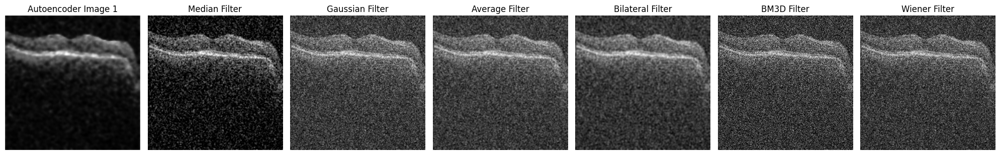

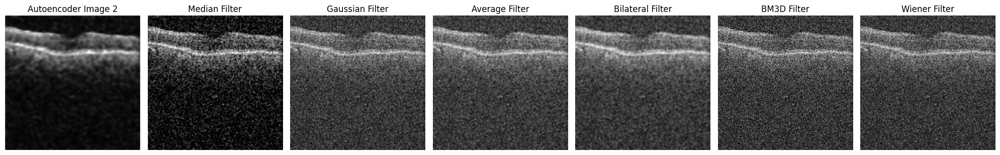

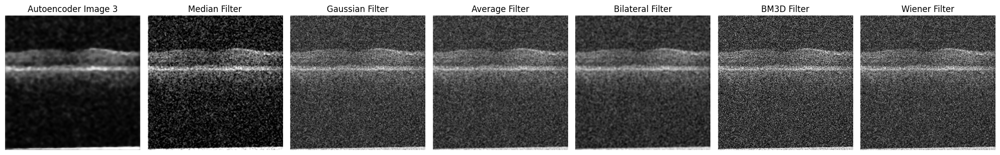

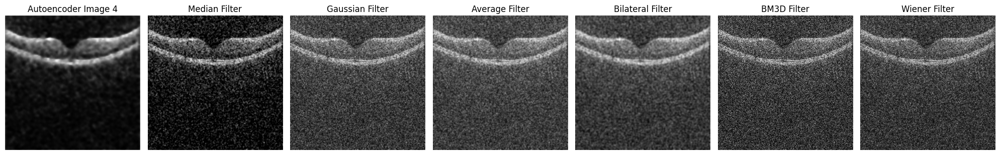

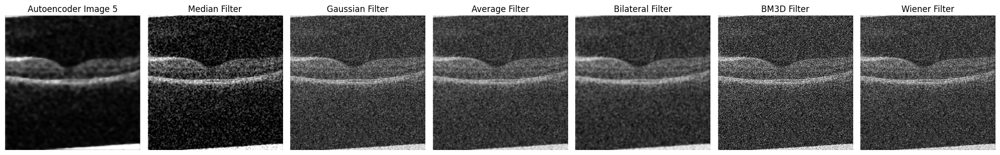

In [33]:
for i in range(5):
    original_image = original_test[i]
    noised_image = noised_test[i]

    # Apply filters
    median_blur = cv2.medianBlur(noised_image, 5)
    gaussian_blur = cv2.GaussianBlur(noised_image, (5, 5), 0)
    average_blur = cv2.blur(noised_image, (5, 5))
    bilateral_filter = cv2.bilateralFilter(noised_image, 9, 75, 75)

    sigma_est = np.mean(estimate_sigma(noised_image, multichannel=False))
    bm3d_blur = bm3d.bm3d(noised_image, sigma_psd=sigma_est)

    wiener_blur = wiener(noised_image.reshape(512, 512), (3, 3))


    # Plot images
    f, ax = plt.subplots(1, 7, figsize=(20, 5))
    ax[0].imshow(pred[i].reshape(512, 512), cmap='gray')
    ax[0].set_title(f'Autoencoder Image {i+1}')
    ax[0].axis('off')

    ax[1].imshow(median_blur, cmap='gray')
    ax[1].set_title('Median Filter')
    ax[1].axis('off')

    ax[2].imshow(gaussian_blur, cmap='gray')
    ax[2].set_title('Gaussian Filter')
    ax[2].axis('off')

    ax[3].imshow(average_blur, cmap='gray')
    ax[3].set_title('Average Filter')
    ax[3].axis('off')

    ax[4].imshow(bilateral_filter, cmap='gray')
    ax[4].set_title('Bilateral Filter')
    ax[4].axis('off')

    ax[5].imshow(bm3d_blur, cmap='gray')
    ax[5].set_title('BM3D Filter')
    ax[5].axis('off')

    ax[6].imshow(wiener_blur, cmap='gray')
    ax[6].set_title('Wiener Filter')
    ax[6].axis('off')

    plt.tight_layout()
    plt.show()
